* This notebook was made to look at hourly nowcasts salinity contours with weak/no wind condition, which could reflect how plume goes with only push by tides.

In [1]:
from __future__ import division, print_function
from salishsea_tools import (nc_tools,viz_tools,stormtools,tidetools)
from salishsea_tools.nowcast import figures
from IPython.display import display, Math, Latex
from salishsea_tools.nowcast import figures
from datetime import datetime, timedelta
from pylab import *
from matplotlib import animation
import matplotlib.dates as mdates
import scipy.io as sio
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import math
import glob
import os
import datetime
%matplotlib inline

In [2]:
def results_dataset(flag,period, grid, results_dir):
    """Return the results dataset for period (e.g. 1h or 1d)
    and grid (e.g. grid_T, grid_U) from results_dir.
    """
    if flag ==0:
        filename_pattern = 'SalishSea_{period}_*_{grid}.nc'
        filepaths = glob(os.path.join(results_dir, filename_pattern.format(period=period, grid=grid)))
    elif flag==1:
        filename_pattern = '1hplume_*_{grid}.nc'
        filepaths = glob(os.path.join(results_dir, filename_pattern.format(period=period, grid=grid)))
    return nc.Dataset(filepaths[0])

In [3]:
def date(year, month, day_start, day_end, period, grid):
    
    day_range = np.arange(day_start, day_end+1)
    day_len = len(day_range)
    files_all = [None] * day_len
    inds = np.arange(day_len)
    
    for i, day in zip(inds, day_range):
        run_date = datetime.datetime(year,month, day)
        results_home = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
        results_dir = os.path.join(results_home, run_date.strftime('%d%b%y').lower())
        filename = 'SalishSea_' + period + '_' + run_date.strftime('%Y%m%d').lower() + \
        '_' + run_date.strftime('%Y%m%d').lower() + '_' + grid + '.nc'
        file_single = os.path.join(results_dir, filename)
        files_all[i] = file_single

    return files_all

In [4]:
def plot_hrsalinity_contour_more(flag,paths, run_date,):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    fig, axs = plt.subplots(24, 2, figsize=(26, 180))
    z1 = 0 
    z2 = 1
    time_step = []
    for i in range(24):
        time_step.append(i)
    results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset(flag, '1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
                for num in range(0, numhours+1)]

    stations=['Tsawwassen','Duke','Vancouver']
    bbox_args = dict(boxstyle='square', facecolor='white', alpha=0.7)
    ferry_stations = {'Tsawwassen': {'lat': 49.0084,'lon': -123.1281},
                  'Duke': {'lat': 49.1632,'lon': -123.8909},
                  'Vancouver': {'lat': 49.2827,'lon': -123.1207}}
    
    for ax, tt, t in zip(axs[:,0], time_step, hours):
        #load variables
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        S =  np.ma.masked_values(S[tt, z1], 0)
        SS = np.ma.masked_values(S[tt, z2], 0)
        #timesteps = grid_T.variables['time_counter']
        zlevels = grid_T.variables['deptht']      
        viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
        delta = 4
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
        clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
        colors='k')
        ax.clabel(clines,  inline = 1, fontsize = 12,inline_spacing =-3, fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(mesh, ax = ax)
        cbar.add_lines(clines)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 15) 
        cbar.set_label('Pratical Salinity', fontsize = 15)
        ## plot station
        for stn in stations:
            ax.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                    color='white',\
                 markersize=10, markeredgewidth=2)
        ax.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
        ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
        ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
        ax.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
        ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
        ##set title and x,y limit
        ax.set_title(t.strftime('%d-%b-%Y %H:%M') + ' at depth {d:.2f}'.format(d = zlevels[0]) +'m',\
                    fontsize = 15)
        ax.set_xlim(-124.3, -122.5)
        ax.set_ylim(48.8, 49.4)
        plt.setp(ax.get_xticklabels(), fontsize=15)
        plt.setp(ax.get_yticklabels(), fontsize=15)
        ax.grid()
        
    for axx, tt, t in zip(axs[:,1], time_step, hours):
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        SS = np.ma.masked_values(S[tt, z2], 0)
        
        viz_tools.set_aspect(axx, coords = 'map', lats=latitude)
        delta = 4
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        meshh = axx.pcolormesh(longitude[:],latitude[:], SS[:], cmap=cmap)
        clines = axx.contour(longitude[:], latitude[:], SS[:], np.arange(0, 28, delta),
        colors='k')
        axx.clabel(clines,  inline = 1, fontsize = 12, inline_spacing =-3, fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(meshh, ax = axx)
        cbar.add_lines(clines)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', fontsize = 15) 
        cbar.set_label('Pratical Salinity',fontsize = 15)
        ## plot station
        for stn in stations:
            axx.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                    color='white',\
                 markersize=10, markeredgewidth=2)
        axx.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
        ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
        axx.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
        ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
        axx.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
        ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
        axx.set_title(t.strftime('%d-%b-%Y %H:%M')+ ' at depth {d:.2f}'.format(d = zlevels[1]) +'m',\
                     fontsize = 15)
        axx.set_xlim(-124.3, -122.5)
        axx.set_ylim(48.8, 49.4)
        plt.setp(axx.get_xticklabels(), fontsize=15)
        plt.setp(axx.get_yticklabels(), fontsize=15)
        axx.grid()
    return fig

* Days with weak wind by refering to the daily nowcast result webiste are June 18 and 25 during my 14 days simulation from June 16-29.

In [5]:
print ("Weak wind days information: ")
print ("Date              (mmdd)       June 18     June 25    ")
print ('wind magnitude range (m/s)     1-4           1-4      ')
print ('wind direction range (NS&WE)   all round     all round   ')

Weak wind days information: 
Date              (mmdd)       June 18     June 25    
wind magnitude range (m/s)     1-4           1-4      
wind direction range (NS&WE)   all round     all round   


* June 18

In [6]:
from glob import glob
run_date = datetime.datetime(2015,6,18)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
paths_wind = '/ocean/sallen/allen/research/Meopar/Operational/'
results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
grid_T = results_dataset(0,'1h','grid_T',results_dir)
grid_B = nc.Dataset('/ocean/jieliu/research/meopar/nemo-forcing/grid/bathy_meter_SalishSea2.nc')
PNW_coastline = sio.loadmat('/ocean/rich/more/mmapbase/bcgeo/PNW.mat')

* For wind information

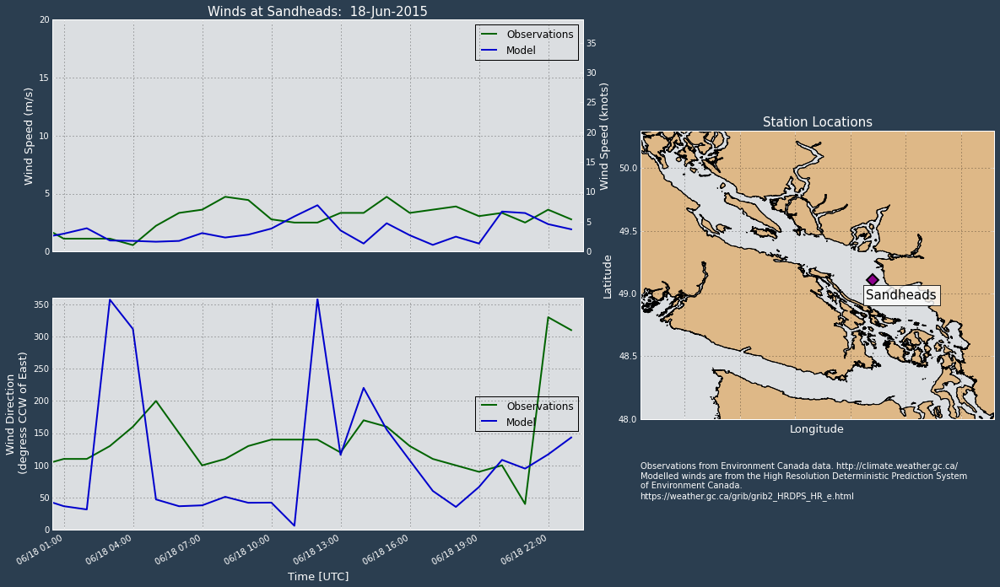

In [7]:
fig = figures.Sandheads_winds(grid_T,grid_B, paths_wind, PNW_coastline, PST=0, figsize=(20, 12) )

* For tide information

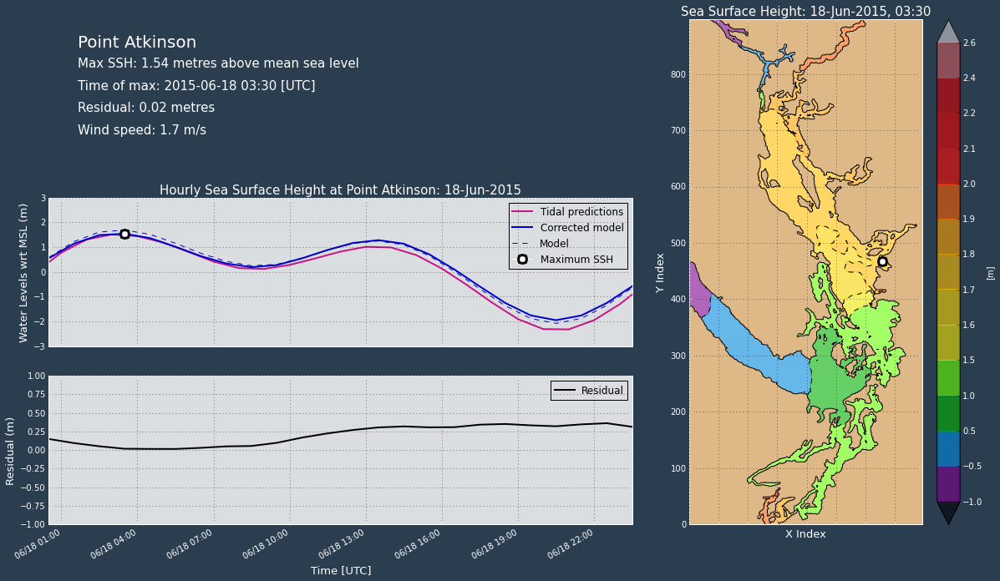

In [8]:
fig = figures.compare_tidalpredictions_maxSSH(grid_T, grid_B, paths_wind, PST=0,\
         MSL=0, name='Point Atkinson',figsize=(20, 12))

In [9]:
print ('Ebb tides begin at 14, ends at 21 on June 18')

Ebb tides begin at 14, ends at 21 on June 18


/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1057: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if aspect == 'normal':
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1062: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif aspect in ('equal', 'auto'):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


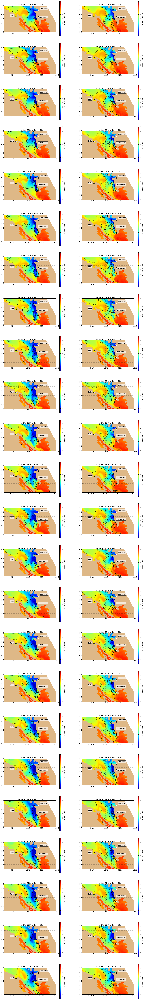

In [10]:
fig = plot_hrsalinity_contour_more(0,paths, run_date)

* June 18 for new model result with bathymetry6

* Plume at 0.5m goes southward and northward nearly both at the beginning before 9:30 am and extended southward finally.
* Eddy featured occurs at 1.5m depth...

In [9]:
from glob import glob
run_date = datetime.datetime(2015,6,18)   
pathss = '/data/jieliu/MEOPAR/river-treatment/14nor_NW/'
paths_wind = '/ocean/sallen/allen/research/Meopar/Operational/'
results_dir = os.path.join(pathss, run_date.strftime('%d%b%y').lower())
grid_T = results_dataset(1,'1h','grid_T',results_dir)

/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1057: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if aspect == 'normal':
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1062: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif aspect in ('equal', 'auto'):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


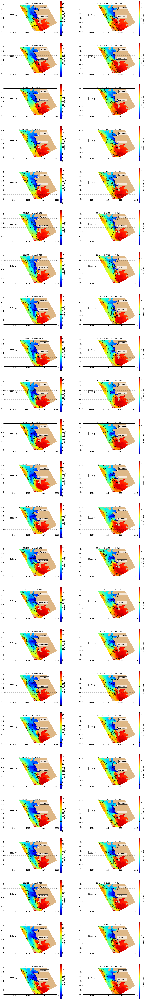

In [10]:
fig = plot_hrsalinity_contour_more(1, pathss, run_date)

* June 25

In [7]:
run_date = datetime.datetime(2015,6,25)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
grid_T = results_dataset('1h','grid_T',results_dir)

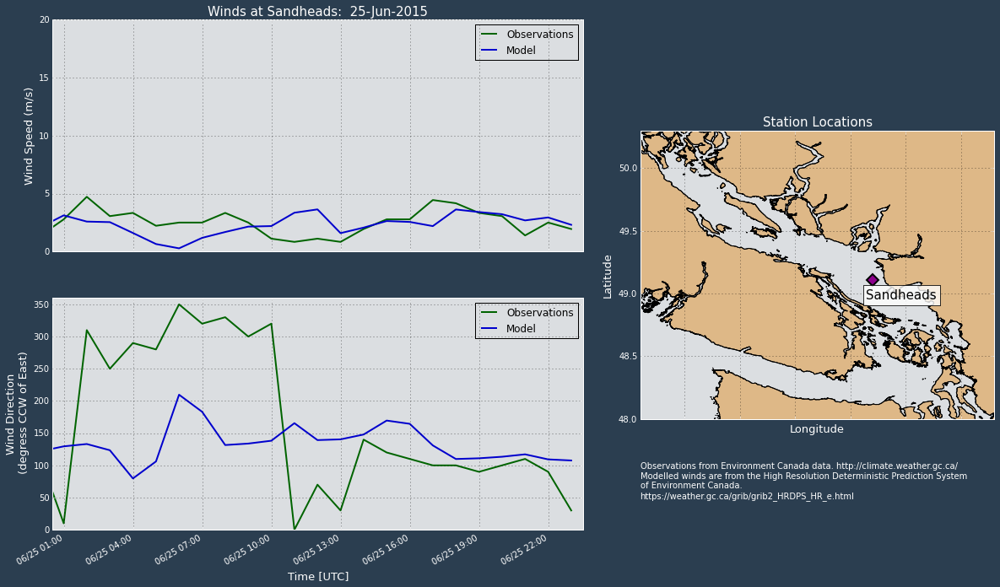

In [15]:
fig = figures.Sandheads_winds(grid_T,grid_B, paths_wind, PNW_coastline, PST=0, figsize=(20, 12) )

* For tide information

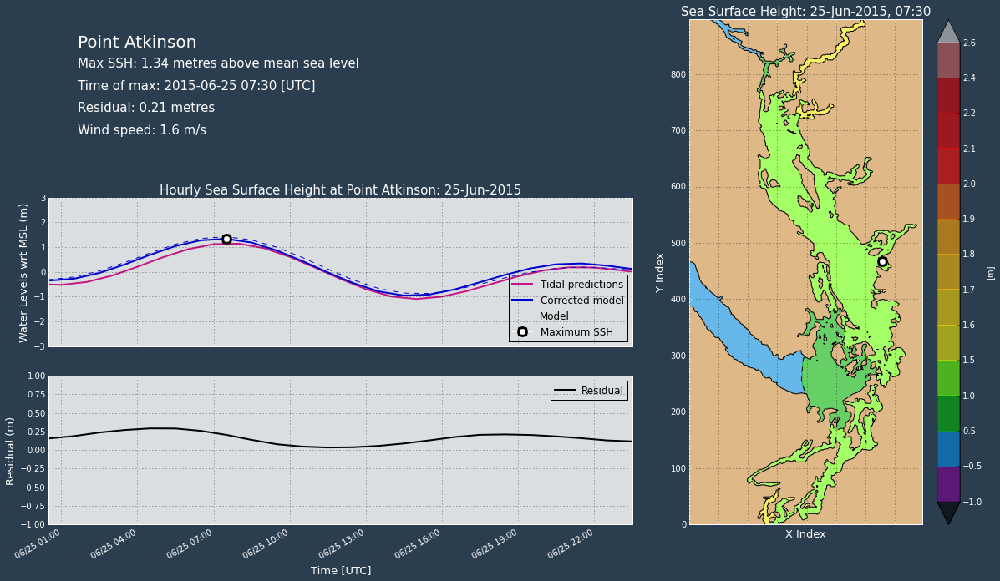

In [22]:
fig = figures.compare_tidalpredictions_maxSSH(grid_T, grid_B, paths_wind, PST=0,\
         MSL=0, name='Point Atkinson',figsize=(20, 12))

In [23]:
print ('Ebb tides begin at 8, end at 15 on June 25')

Ebb tides begin at 8, end at 15 on June 25


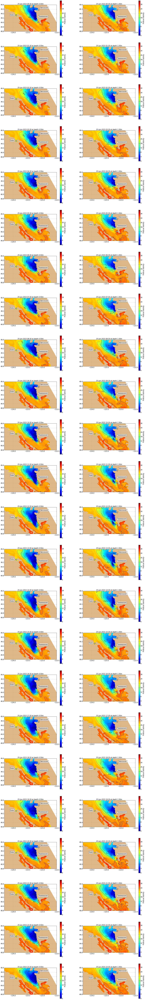

In [16]:
fig = plot_hrsalinity_contour_more(0,paths, run_date)

* Plume below 12 units was pushed southward during ebb tide at depth 0.5m from animation.
* Plume area below 12 units is smaller at depth 1.5m than that at depth 0.5m.

* June 25 for new model result

In [20]:
from glob import glob
run_date = datetime.datetime(2015,6,25)   
pathss = '/data/jieliu/MEOPAR/river-treatment/14nor_NW/'
paths_wind = '/ocean/sallen/allen/research/Meopar/Operational/'
results_dir = os.path.join(pathss, run_date.strftime('%d%b%y').lower())
grid_T = results_dataset(1,'1h','grid_T',results_dir)

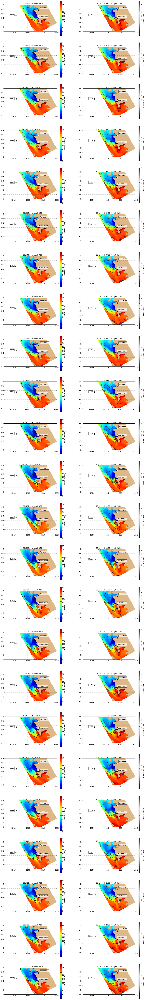

In [21]:
fig = plot_hrsalinity_contour_more(1, pathss, run_date)

# Preparations for animation

In [25]:
def plot_hrsalinity_contour(t):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    #fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.clear()
    z = 1 
    #time_step = []
    #for i in range(24):
        #time_step.append(i)
    paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
    run_date = datetime.datetime(2015,6,18) 
    results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset(0,'1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]
    stations=['Tsawwassen','Duke','Vancouver']
    bbox_args = dict(boxstyle='square', facecolor='white', alpha=0.7)
    ferry_stations = {'Tsawwassen': {'lat': 49.0084,'lon': -123.1281},
                  'Duke': {'lat': 49.1632,'lon': -123.8909},
                  'Vancouver': {'lat': 49.2827,'lon': -123.1207}}
    
    #for ax, tt, t in zip(axs, time_step, hours):
        #load variables
    latitude=grid_T.variables['nav_lat'] 
    longitude=grid_T.variables['nav_lon']
    S = grid_T.variables['vosaline']
    S =  np.ma.masked_values(S[t, z], 0)
    timesteps = grid_T.variables['time_counter']
    zlevels = grid_T.variables['deptht']      
    viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
    delta = 4
    cmap = plt.get_cmap('jet')
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
    clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
    colors='k')
    ax.clabel(clines,  inline = 1, inline_spacing =-3, fmt='%1.1f')
   
    #cbar = plt.colorbar(mesh, ax = ax)
    #cbar.add_lines(clines)
    #cbar.set_label('Pratical Salinity')
        ## plot station
    for stn in stations:
        ax.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                color='white',\
                markersize=10, markeredgewidth=2)
    ax.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
    ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
    ax.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
    ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
    ax.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
    ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
    ##set title and x,y limit
    ax.set_title(hours[t].strftime('%d-%b-%Y %H:%M')+ ' at depth {d:.2f}'.format(d = zlevels[z]) +'m')
    ax.set_xlim(-124.3, -122.5)
    ax.set_ylim(48.8, 49.4)
    ax.grid()
    return mesh, clines

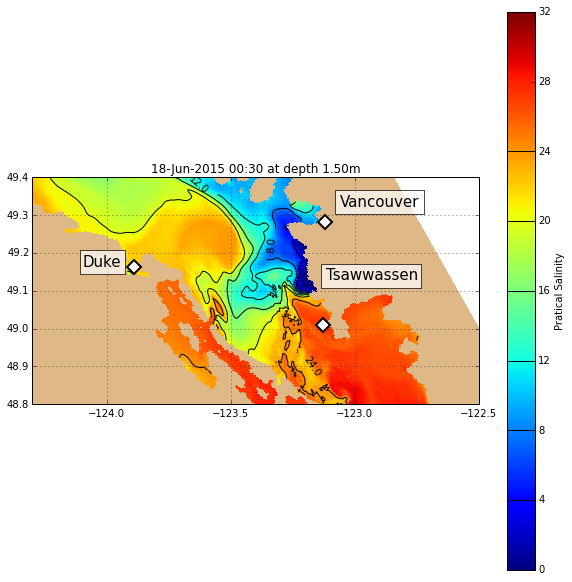

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
t = 0
mesh, clines= plot_hrsalinity_contour(t)
cbar = plt.colorbar(mesh, ax = ax)
cbar.add_lines(clines)
cbar.set_label('Pratical Salinity')

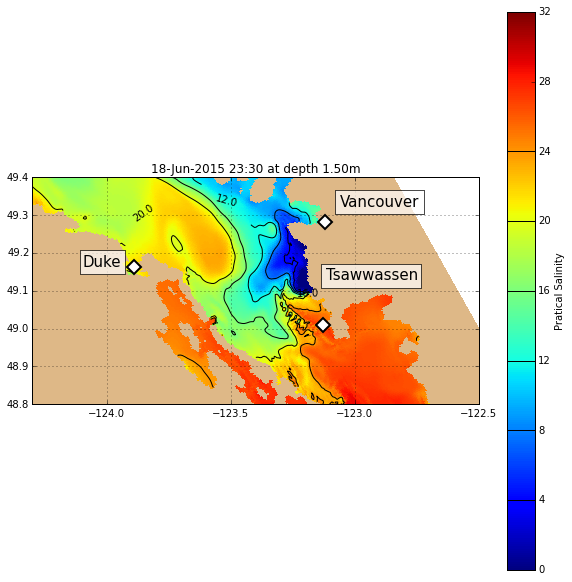

In [27]:
## make animation
#Setting up first frame and static content
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
mesh,clines = plot_hrsalinity_contour(0)
cbar = plt.colorbar(mesh, ax = ax)
cbar.add_lines(clines)
cbar.set_label('Pratical Salinity')

# list all frames
framess=np.arange(0,24)

#The animation function    
anim = animation.FuncAnimation(fig, plot_hrsalinity_contour, frames=framess,  blit=True, repeat=False)

#A line that makes it all work
mywriter = animation.FFMpegWriter( fps=2, bitrate=10000)
anim.save('salinity-18jun15-1.5m.mp4',writer=mywriter)

* Animation for new model result

In [32]:
def plot_hrsalinity_contournew(t):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    #fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.clear()
    z = 1 
    #time_step = []
    #for i in range(24):
        #time_step.append(i)
    pathss = '/data/jieliu/MEOPAR/river-treatment/14nor_NW/'
    run_date = datetime.datetime(2015,6,25) 
    results_dir = os.path.join(pathss, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset(1,'1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]
    stations=['Tsawwassen','Duke','Vancouver']
    bbox_args = dict(boxstyle='square', facecolor='white', alpha=0.7)
    ferry_stations = {'Tsawwassen': {'lat': 49.0084,'lon': -123.1281},
                  'Duke': {'lat': 49.1632,'lon': -123.8909},
                  'Vancouver': {'lat': 49.2827,'lon': -123.1207}}
    
    #for ax, tt, t in zip(axs, time_step, hours):
        #load variables
    latitude=grid_T.variables['nav_lat'] 
    longitude=grid_T.variables['nav_lon']
    S = grid_T.variables['vosaline']
    S =  np.ma.masked_values(S[t, z], 0)
    timesteps = grid_T.variables['time_counter']
    zlevels = grid_T.variables['deptht']      
    viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
    delta = 4
    cmap = plt.get_cmap('jet')
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
    clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
    colors='k')
    ax.clabel(clines,  inline = 1, inline_spacing =-3, fmt='%1.1f')
   
    #cbar = plt.colorbar(mesh, ax = ax)
    #cbar.add_lines(clines)
    #cbar.set_label('Pratical Salinity')
        ## plot station
    for stn in stations:
        ax.plot(ferry_stations[stn]['lon'], ferry_stations[stn]['lat'], marker='D', \
                color='white',\
                markersize=10, markeredgewidth=2)
    ax.annotate ('Tsawwassen',(ferry_stations['Tsawwassen']['lon'] + 0.01,\
    ferry_stations['Tsawwassen']['lat'] + 0.12), fontsize=15, color='black', bbox=bbox_args )
    ax.annotate ('Duke',(ferry_stations['Duke']['lon'] - 0.2,\
    ferry_stations['Duke']['lat'] ),fontsize=15, color='black', bbox=bbox_args )
    ax.annotate ('Vancouver',(ferry_stations['Vancouver']['lon'] + 0.06 ,\
    ferry_stations['Vancouver']['lat']+ 0.04 ),fontsize=15, color='black', bbox=bbox_args )
    ##set title and x,y limit
    ax.set_title(hours[t].strftime('%d-%b-%Y %H:%M')+ ' at depth {d:.2f}'.format(d = zlevels[z]) +'m')
    ax.set_xlim(-124.3, -122.5)
    ax.set_ylim(48.8, 49.4)
    ax.grid()
    return mesh, clines

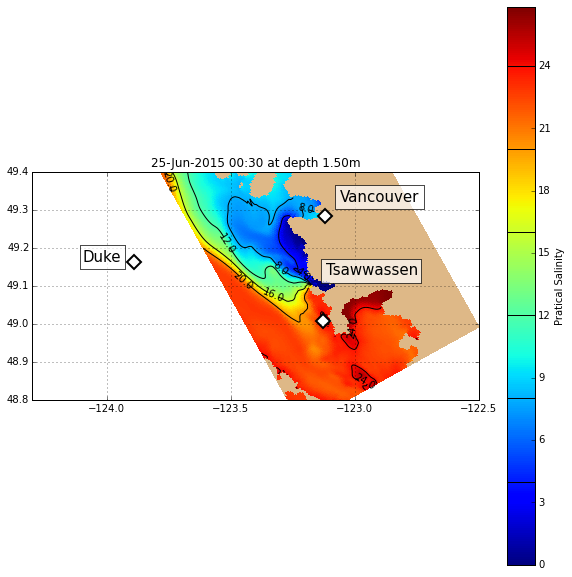

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
t = 0
mesh, clines= plot_hrsalinity_contournew(t)
cbar = plt.colorbar(mesh, ax = ax)
cbar.add_lines(clines)
cbar.set_label('Pratical Salinity')

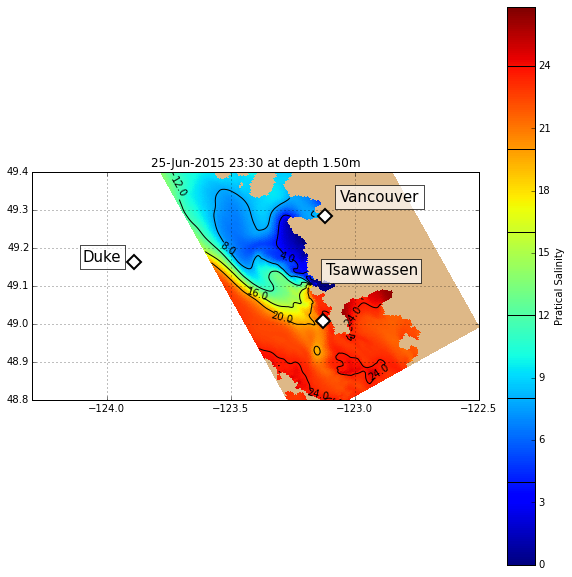

In [34]:
## make animation
#Setting up first frame and static content
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
mesh,clines = plot_hrsalinity_contournew(0)
cbar = plt.colorbar(mesh, ax = ax)
cbar.add_lines(clines)
cbar.set_label('Pratical Salinity')

# list all frames
framess=np.arange(0,24)

#The animation function    
anim = animation.FuncAnimation(fig, plot_hrsalinity_contournew, frames=framess,  blit=True, repeat=False)

#A line that makes it all work
mywriter = animation.FFMpegWriter( fps=2, bitrate=10000)
anim.save('salinitynew-25jun15-1.5m.mp4',writer=mywriter)